## `SUMMARY`

UTK head dataset: kaggle datasets download -d sebastiendelprat/utk-head-data-set

This dataset comprises 22 884 images of heads extracted from the original UTK face dataset. 

Task is to classify the images and predict the age & gender of the people.

-[age] is an integer from 0 to 116, indicating the age

-[gender] is either 0 (male) or 1 (female)

-[date&time] is in the format of yyyymmddHHMMSSFFF, showing the date and time an image was collected to UTKFace

In [1]:
import tensorflow
from tensorflow import keras
import os
import shutil
import numpy as np
import pandas as pd
from keras.preprocessing.image import ImageDataGenerator
from keras.layers import Flatten,Dense,Dropout
from keras.models import Model
import matplotlib.pyplot as pandas
import seaborn as sns

In [2]:
!mkdir -p /root/.kaggle
!cp /content/drive/MyDrive/kaggle.json /root/.kaggle/

In [3]:
!kaggle datasets download -d sebastiendelprat/utk-head-data-set

 96% 287M/298M [00:02<00:00, 112MB/s]
100% 298M/298M [00:02<00:00, 105MB/s]


In [4]:
!unzip -q utk-head-data-set.zip

In [5]:
import cv2
import matplotlib.pyplot as plt
import random

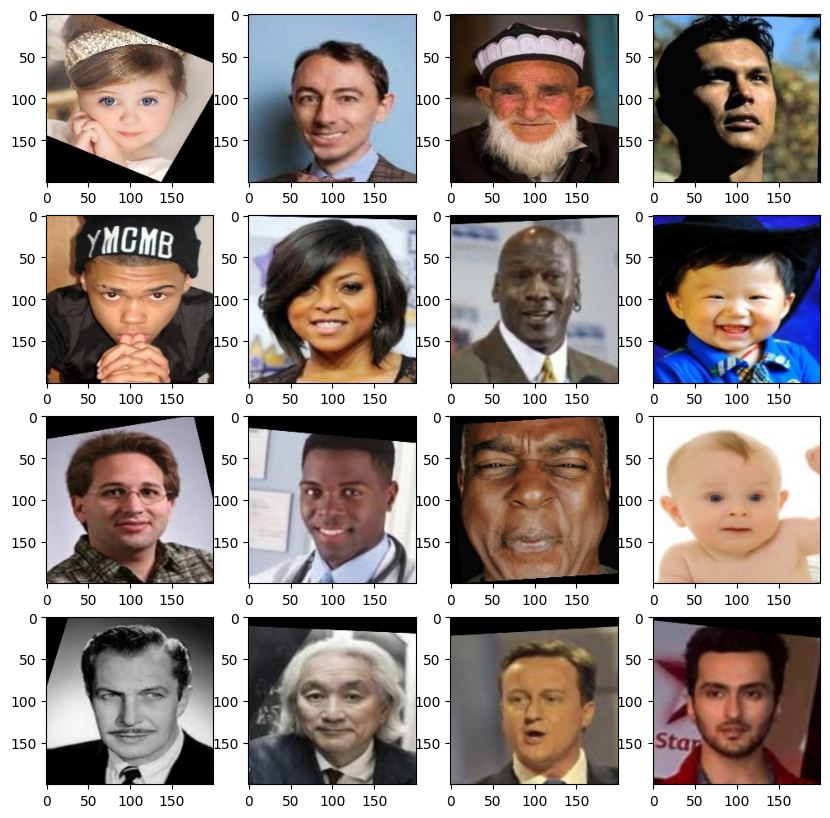

In [6]:
plt.figure(figsize=(10,10))
for i in range(1,17):
  a = random.randint(1,len(os.listdir('train')))
  img = os.listdir('train')[a]
  img = cv2.imread('train/'+img)
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  plt.subplot(4,4,i)
  plt.imshow(img)

In [7]:
#The labels of each face image is embedded in the file name, formated like [age]_[gender]_[race]_[date&time].jpg

In [8]:
#creating lists for required dataframe:
train_age = []
train_gender = []
train_img_path = []


for imagename in os.listdir('train'):
  
  #splitting the imagename over '_' to get age,gender and race
  a = imagename.split('_')   
  
  if len(a[1]) < 2:
    train_age.append(int(a[0]))
    train_gender.append(int(a[1]))
    train_img_path.append(imagename)
  else:
    print(imagename)
    continue

#checking the size of the lists.
print(len(train_age))
print(len(train_gender))
print(len(train_img_path))

15994
15994
15994


In [9]:
#creating lists for required dataframe:
val_age = []
val_gender = []
val_img_path = []


for imagename in os.listdir('validation'):
  
  #splitting the imagename over '_' to get age,gender and race
  a = imagename.split('_')   
  
  if len(a[1]) < 2:
    val_age.append(int(a[0]))
    val_gender.append(int(a[1]))
    val_img_path.append(imagename)
  else:
    print(imagename)
    continue

#checking the size of the lists.
print(len(val_age))
print(len(val_gender))
print(len(val_img_path))

3444
3444
3444


In [10]:
#creating a dataframe:
train_df = pd.DataFrame(data = {'age':train_age,'gender':train_gender,'img':train_img_path})
val_df = pd.DataFrame(data = {'age':val_age,'gender':val_gender,'img':val_img_path})

In [11]:
#taking a glance at the df
train_df.head()

,age,gender,img
0,1,0,1_0_2_20161219153318900.jpg
1,8,1,8_1_0_20170116234733445.jpg
2,75,0,75_0_0_20170117163552393.jpg
3,20,0,20_0_0_20170105161706251.jpg
4,34,1,34_1_3_20170119200853821.jpg


In [12]:
train_df.isnull().sum()

age       0
gender    0
img       0
dtype: int64

In [13]:
train_df.duplicated().sum()

0

In [14]:
# checking the value counts of gender col
train_df['gender'].value_counts()

0    8357
1    7637
Name: gender, dtype: int64

In [15]:
# statistical analysis of age col
train_df['age'].describe(percentiles=[0.25,0.5,0.75,0.9,0.99])

count    15994.000000
mean        33.667125
std         19.393531
min          1.000000
25%         24.000000
50%         30.000000
75%         45.000000
90%         60.000000
99%         86.000000
max        116.000000
Name: age, dtype: float64

<Axes: xlabel='age'>

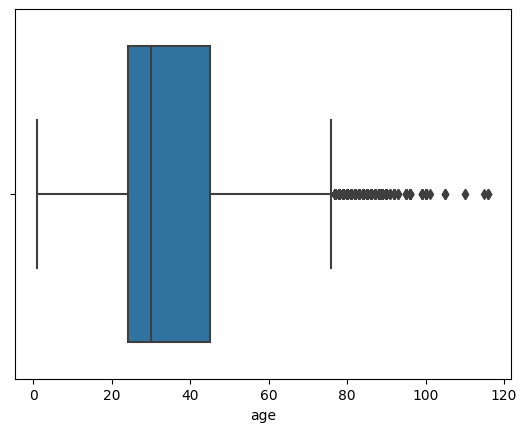

In [16]:
sns.boxplot(x=train_df['age'])

In [17]:
# checking the number of rows where age is greater than 100
train_df[train_df['age'] > 90]['gender'].value_counts()

1    46
0     4
Name: gender, dtype: int64

In [18]:
# As 99% of the data has age below 90 and majority of images having age above 90 are female, 
# hence we will drop the rows where age is > 90
label_df = train_df[~(train_df['age'] > 90)]

<Axes: xlabel='age'>

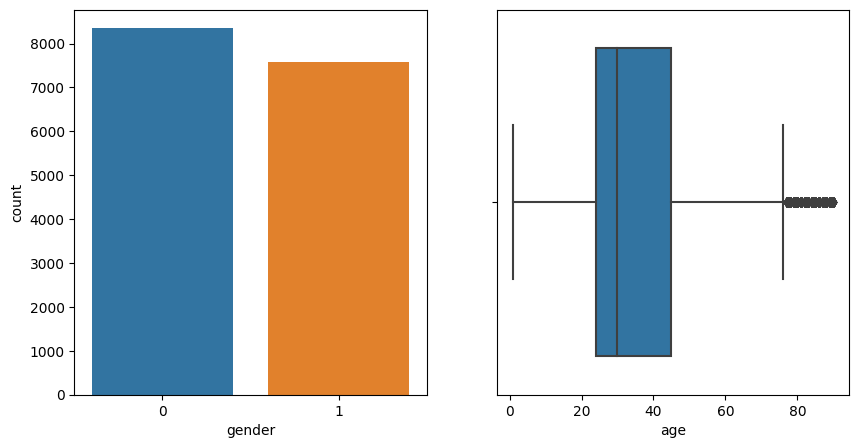

In [19]:
plt.figure(figsize=(10,5))
plt.subplot(1,2,1)
sns.countplot(x=label_df['gender'])

plt.subplot(1,2,2)
sns.boxplot(x=label_df['age'])

In [20]:
# re-checking statistical analysis of age col
label_df['age'].describe(percentiles=[0.25,0.5,0.75,0.9,0.99])

count    15944.000000
mean        33.463246
std         19.074895
min          1.000000
25%         24.000000
50%         30.000000
75%         45.000000
90%         60.000000
99%         85.000000
max         90.000000
Name: age, dtype: float64

In [21]:
# checking the shape of our df
label_df.shape

(15944, 3)

In [22]:
val_df.head()

,age,gender,img
0,8,0,8_0_0_20170110220246250.jpg
1,43,0,43_0_3_20170119180619699.jpg
2,58,0,58_0_0_20170109015204241.jpg
3,40,0,40_0_2_20170116193717434.jpg
4,62,1,62_1_2_20170116191832323.jpg


In [23]:
#creating the idg for image augumentation:
idg = ImageDataGenerator(rescale=1/255,
                         rotation_range=10,
                         width_shift_range=0.2,
                         height_shift_range=0.2,
                         shear_range=0.1,
                         zoom_range=0.1,
                         horizontal_flip=True,
                         validation_split=0.2)


In [24]:
# generating training data using idg:
train_gen = idg.flow_from_dataframe(label_df,
                                    directory='/content/train/',
                                    x_col = 'img',
                                    y_col = ['gender','age'],
                                    target_size=(200,200),
                                    class_mode = 'multi_output')


# generating validation data using idg:
val_gen = idg.flow_from_dataframe(val_df,
                                    directory='/content/validation/',
                                    x_col = 'img',
                                    y_col = ['gender','age'],
                                    target_size=(200,200),
                                    class_mode = 'multi_output')


Found 15944 validated image filenames.
Found 3444 validated image filenames.


#Building the model:

In [25]:
#importing models for transfer learning.
#from keras.applications.resnet import ResNet50
from keras.applications.vgg16 import VGG16
from keras.applications.inception_v3 import InceptionV3,preprocess_input

In [26]:
# creating the variable for the model:
#res50 = ResNet50(include_top=False, input_shape=(243,243,3))
#vgg = VGG16(include_top=False, input_shape=(243,243,3), weights='imagenet')
inc = InceptionV3(include_top=False, input_shape=(200,200,3), weights='imagenet')

87910968/87910968 [==============================] - 0s 0us/step


In [27]:
# setting the trainable value as False for no re-training of parameters
inc.trainable = False

In [51]:
#Constructing the layers:
output = inc.layers[-1].output

#flatten layer:
flatten = Flatten()(output)

#Creating layers for 'gender':

gd1 = Dense(32,activation='leaky_relu')(flatten)
gd2 = Dense(64,activation='leaky_relu')(gd1)
gd3 = Dense(128,activation='leaky_relu')(gd2)
gd4 = Dense(64,activation='leaky_relu')(gd3)

#Creating layers for 'age':

ad1 = Dense(32,activation='linear')(flatten)
ad2 = Dense(64,activation='linear')(ad1)
ad3 = Dense(128,activation='leaky_relu')(ad2)
ad4 = Dense(64,activation='leaky_relu')(ad3)

#creating output layer:
output1 = Dense(1,activation='sigmoid',name='gender')(gd4)
output2 = Dense(1,activation='relu',name='age')(ad4)


In [52]:
#del model

In [53]:
## combining input and output to our final model.
model = Model(inputs=inc.input, outputs=[output1,output2])

In [54]:
# checking the flow of model
#model.summary()

In [55]:
# plotting the tree of model.
from keras.utils import plot_model
#plot_model(model, show_shapes=True)

In [56]:
#compiling the model
model.compile(optimizer=keras.optimizers.Adagrad(),
              loss={'age': 'mae' ,'gender':keras.losses.BinaryCrossentropy()},
              metrics={'age':'mae','gender':'accuracy'})

In [60]:
# crearing a callback to avoid overfitting
callback = tensorflow.keras.callbacks.EarlyStopping(monitor='val_age_mae',
                                            min_delta=0.000001,
                                            patience=5,
                                            verbose=1,
                                            mode='min',
                                            restore_best_weights=True)

class CustomCallBacks(keras.callbacks.Callback):
  def on_epoch_end(self,epoch,logs={}):
    num = random.randint(0,len(os.listdir('validation'))) #generating a random number
    img_path = os.listdir('validation')[num] #fetching the file name
    og_age = img_path.split('_')[0] #extracting original age
    og_gen = img_path.split('_')[1] #extracting original gender

    img = cv2.imread('validation/'+img_path) #reading the image
    plt_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) #converting BGR to RGB
    image = np.expand_dims(img, axis=0) #expanding the shape to (1,200,200,3)
    image = image/255.0 #normalizaing the values in the array.
    
    pred = model.predict(image) #predicting the image output
    pred_gen = pred[0][0][0] #assigning predicted gender
    pred_age = int(pred[1][0][0]) #assigning predicted age

    #printing the image
    print(img_path)
    plt.imshow(plt_img)
    plt.show()
    
    #printing original age and gender
    if og_gen == '0':
        print("|ACTUAL| The person in the image is actualy a male and his actual age is {} years.".format(og_age))
    else:
        print("|ACTUAL| The person in the image is actualy a female and her actual age is {} years.".format(og_age))

    #printing predicted age and gender
    if pred_gen <= 0.5:
      print("|PREDICTED| The person in the image is a male and his age is approximately {} years.".format(pred_age))      
    else:
      print("|PREDICTED| The person in the image is a female and her age is approximately {} years.".format(pred_age))

    

Epoch 1/50
1/1 [==============================] - 1s 1s/step
26_0_4_20170117195722036.jpg


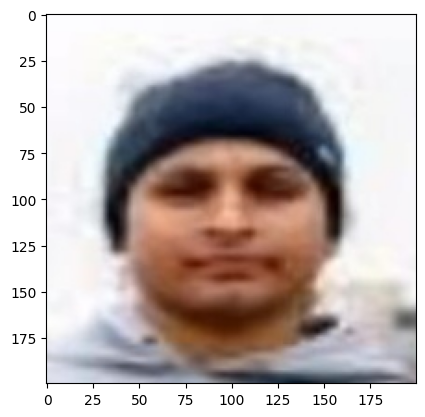

|ACTUAL| The person in the image is actualy a male and his actual age is 26 years.
|PREDICTED| The person in the image is a female and her age is approximately 28 years.
499/499 [==============================] - 203s 406ms/step - loss: 9.3959 - gender_loss: 0.3448 - age_loss: 9.0511 - gender_accuracy: 0.8492 - age_mae: 9.0511 - val_loss: 9.2553 - val_gender_loss: 0.3277 - val_age_loss: 8.9276 - val_gender_accuracy: 0.8560 - val_age_mae: 8.9276
Epoch 2/50
1/1 [==============================] - 0s 26ms/step
26_0_1_20170116204952113.jpg


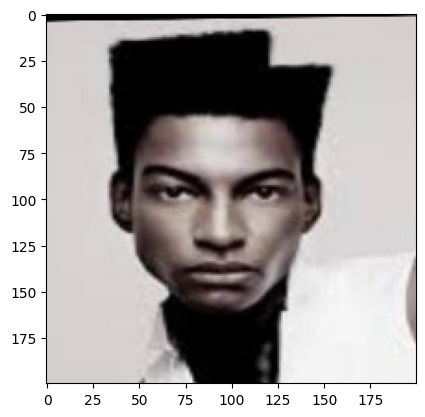

|ACTUAL| The person in the image is actualy a male and his actual age is 26 years.
|PREDICTED| The person in the image is a male and his age is approximately 27 years.
499/499 [==============================] - 201s 402ms/step - loss: 8.9263 - gender_loss: 0.3279 - age_loss: 8.5984 - gender_accuracy: 0.8579 - age_mae: 8.5984 - val_loss: 9.1381 - val_gender_loss: 0.3166 - val_age_loss: 8.8215 - val_gender_accuracy: 0.8609 - val_age_mae: 8.8215
Epoch 3/50
1/1 [==============================] - 0s 26ms/step
22_1_2_20170116172726806.jpg


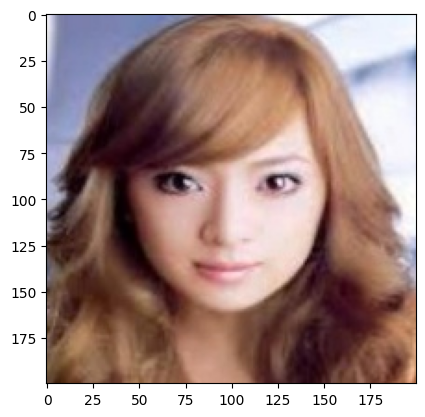

|ACTUAL| The person in the image is actualy a female and her actual age is 22 years.
|PREDICTED| The person in the image is a female and her age is approximately 28 years.
499/499 [==============================] - 201s 402ms/step - loss: 8.6483 - gender_loss: 0.3162 - age_loss: 8.3321 - gender_accuracy: 0.8651 - age_mae: 8.3321 - val_loss: 8.8048 - val_gender_loss: 0.3187 - val_age_loss: 8.4861 - val_gender_accuracy: 0.8653 - val_age_mae: 8.4861
Epoch 4/50
1/1 [==============================] - 0s 26ms/step
4_1_0_20170109201611941.jpg


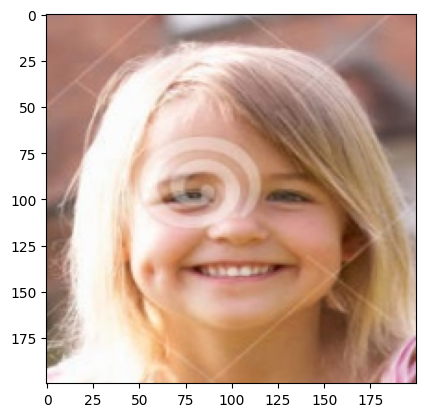

|ACTUAL| The person in the image is actualy a female and her actual age is 4 years.
|PREDICTED| The person in the image is a female and her age is approximately 57 years.
499/499 [==============================] - 209s 418ms/step - loss: 8.5515 - gender_loss: 0.3109 - age_loss: 8.2406 - gender_accuracy: 0.8646 - age_mae: 8.2406 - val_loss: 8.8360 - val_gender_loss: 0.3177 - val_age_loss: 8.5183 - val_gender_accuracy: 0.8595 - val_age_mae: 8.5183
Epoch 5/50
1/1 [==============================] - 0s 27ms/step
30_1_3_20170109132828919.jpg


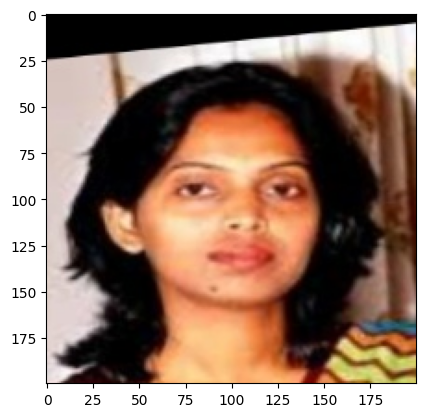

|ACTUAL| The person in the image is actualy a female and her actual age is 30 years.
|PREDICTED| The person in the image is a female and her age is approximately 27 years.
499/499 [==============================] - 201s 403ms/step - loss: 8.4826 - gender_loss: 0.3059 - age_loss: 8.1766 - gender_accuracy: 0.8686 - age_mae: 8.1766 - val_loss: 8.7787 - val_gender_loss: 0.3185 - val_age_loss: 8.4602 - val_gender_accuracy: 0.8586 - val_age_mae: 8.4602
Epoch 6/50
1/1 [==============================] - 0s 27ms/step
28_0_0_20170116220549107.jpg


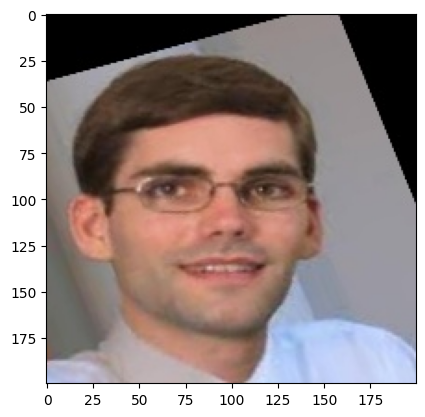

|ACTUAL| The person in the image is actualy a male and his actual age is 28 years.
|PREDICTED| The person in the image is a male and his age is approximately 37 years.
499/499 [==============================] - 201s 402ms/step - loss: 8.4068 - gender_loss: 0.3077 - age_loss: 8.0991 - gender_accuracy: 0.8681 - age_mae: 8.0991 - val_loss: 8.7317 - val_gender_loss: 0.3003 - val_age_loss: 8.4314 - val_gender_accuracy: 0.8705 - val_age_mae: 8.4314
Epoch 7/50
1/1 [==============================] - 0s 27ms/step
30_0_0_20170117181118268.jpg


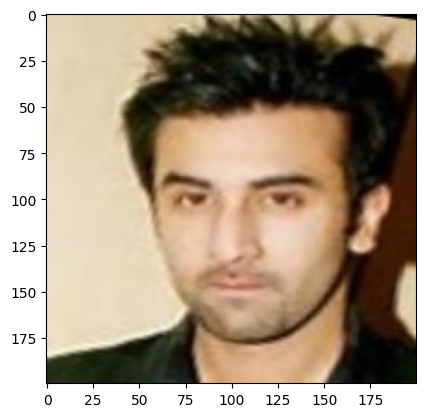

|ACTUAL| The person in the image is actualy a male and his actual age is 30 years.
|PREDICTED| The person in the image is a male and his age is approximately 24 years.
499/499 [==============================] - 203s 407ms/step - loss: 8.3063 - gender_loss: 0.3016 - age_loss: 8.0047 - gender_accuracy: 0.8721 - age_mae: 8.0047 - val_loss: 8.6491 - val_gender_loss: 0.3080 - val_age_loss: 8.3411 - val_gender_accuracy: 0.8670 - val_age_mae: 8.3411
Epoch 8/50
1/1 [==============================] - 0s 27ms/step
25_1_1_20170113011541030.jpg


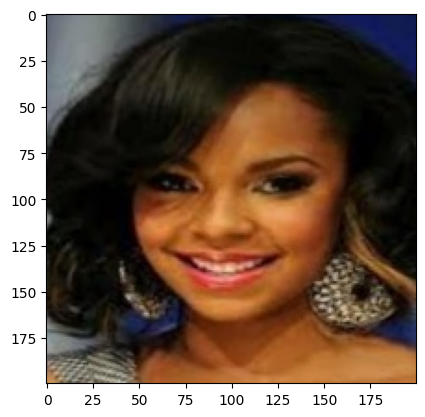

|ACTUAL| The person in the image is actualy a female and her actual age is 25 years.
|PREDICTED| The person in the image is a female and her age is approximately 31 years.
499/499 [==============================] - 204s 410ms/step - loss: 8.1704 - gender_loss: 0.2946 - age_loss: 7.8758 - gender_accuracy: 0.8719 - age_mae: 7.8758 - val_loss: 8.4794 - val_gender_loss: 0.3013 - val_age_loss: 8.1781 - val_gender_accuracy: 0.8638 - val_age_mae: 8.1781
Epoch 9/50
1/1 [==============================] - 0s 26ms/step
37_1_1_20170112220107657.jpg


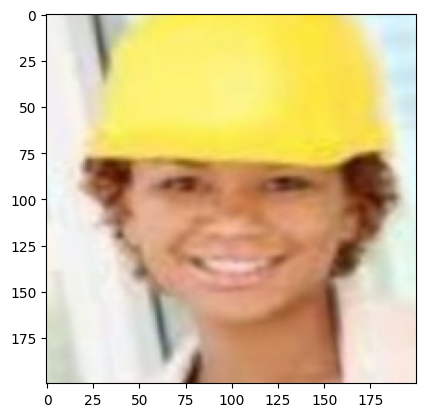

|ACTUAL| The person in the image is actualy a female and her actual age is 37 years.
|PREDICTED| The person in the image is a male and his age is approximately 15 years.
499/499 [==============================] - 211s 422ms/step - loss: 8.1597 - gender_loss: 0.2949 - age_loss: 7.8648 - gender_accuracy: 0.8737 - age_mae: 7.8648 - val_loss: 8.5112 - val_gender_loss: 0.3096 - val_age_loss: 8.2016 - val_gender_accuracy: 0.8670 - val_age_mae: 8.2016
Epoch 10/50
1/1 [==============================] - 0s 27ms/step
55_1_3_20170119192720664.jpg


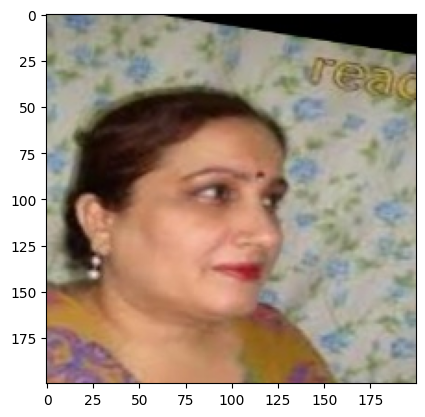

|ACTUAL| The person in the image is actualy a female and her actual age is 55 years.
|PREDICTED| The person in the image is a male and his age is approximately 27 years.
499/499 [==============================] - 206s 413ms/step - loss: 8.0847 - gender_loss: 0.2906 - age_loss: 7.7941 - gender_accuracy: 0.8763 - age_mae: 7.7941 - val_loss: 8.4184 - val_gender_loss: 0.3003 - val_age_loss: 8.1181 - val_gender_accuracy: 0.8670 - val_age_mae: 8.1181
Epoch 11/50
1/1 [==============================] - 0s 33ms/step
20_1_2_20170112003857668.jpg


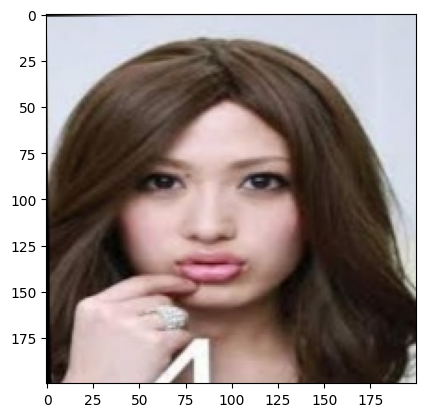

|ACTUAL| The person in the image is actualy a female and her actual age is 20 years.
|PREDICTED| The person in the image is a female and her age is approximately 27 years.
499/499 [==============================] - 206s 413ms/step - loss: 8.0958 - gender_loss: 0.2891 - age_loss: 7.8066 - gender_accuracy: 0.8760 - age_mae: 7.8066 - val_loss: 8.3777 - val_gender_loss: 0.2879 - val_age_loss: 8.0899 - val_gender_accuracy: 0.8696 - val_age_mae: 8.0899
Epoch 12/50
1/1 [==============================] - 0s 27ms/step
31_1_1_20170116224134208.jpg


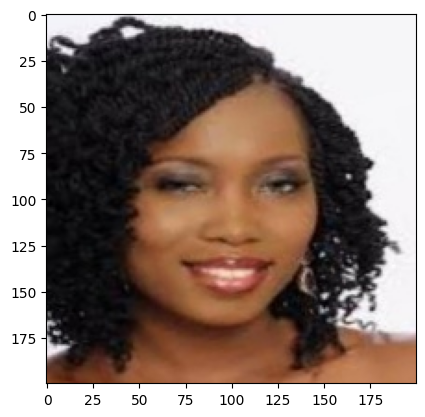

|ACTUAL| The person in the image is actualy a female and her actual age is 31 years.
|PREDICTED| The person in the image is a female and her age is approximately 25 years.
499/499 [==============================] - 207s 414ms/step - loss: 7.9958 - gender_loss: 0.2883 - age_loss: 7.7076 - gender_accuracy: 0.8768 - age_mae: 7.7076 - val_loss: 8.2439 - val_gender_loss: 0.2899 - val_age_loss: 7.9540 - val_gender_accuracy: 0.8734 - val_age_mae: 7.9540
Epoch 13/50
1/1 [==============================] - 0s 25ms/step
16_1_4_20170103201023166.jpg


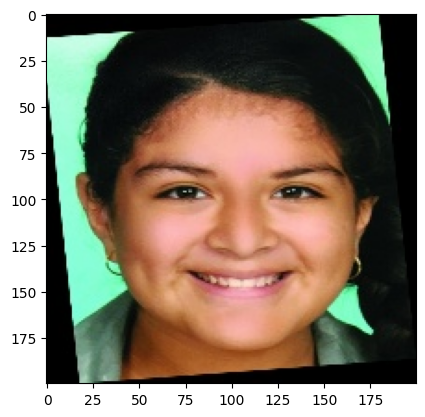

|ACTUAL| The person in the image is actualy a female and her actual age is 16 years.
|PREDICTED| The person in the image is a female and her age is approximately 10 years.
499/499 [==============================] - 204s 410ms/step - loss: 8.0056 - gender_loss: 0.2828 - age_loss: 7.7228 - gender_accuracy: 0.8801 - age_mae: 7.7228 - val_loss: 8.4793 - val_gender_loss: 0.2902 - val_age_loss: 8.1891 - val_gender_accuracy: 0.8731 - val_age_mae: 8.1891
Epoch 14/50
1/1 [==============================] - 0s 27ms/step
18_1_0_20170109213142404.jpg


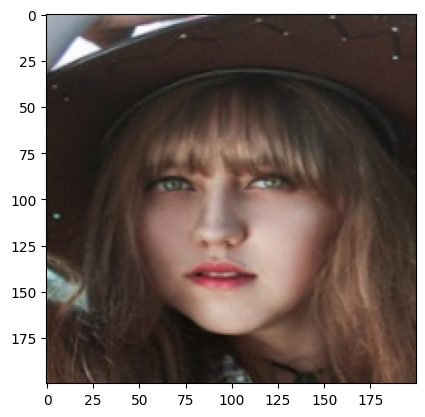

|ACTUAL| The person in the image is actualy a female and her actual age is 18 years.
|PREDICTED| The person in the image is a male and his age is approximately 9 years.
499/499 [==============================] - 202s 406ms/step - loss: 7.9775 - gender_loss: 0.2791 - age_loss: 7.6985 - gender_accuracy: 0.8809 - age_mae: 7.6985 - val_loss: 8.3415 - val_gender_loss: 0.3036 - val_age_loss: 8.0379 - val_gender_accuracy: 0.8696 - val_age_mae: 8.0379
Epoch 15/50
1/1 [==============================] - 0s 32ms/step
25_0_1_20170116003152620.jpg


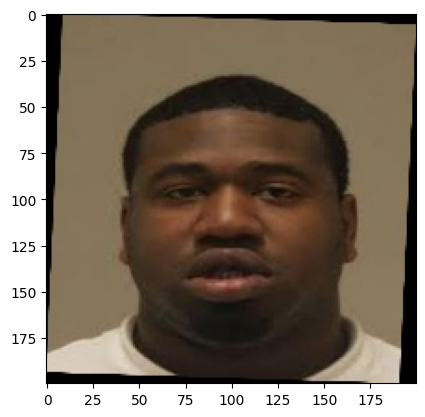

|ACTUAL| The person in the image is actualy a male and his actual age is 25 years.
|PREDICTED| The person in the image is a male and his age is approximately 37 years.
499/499 [==============================] - 202s 404ms/step - loss: 7.9534 - gender_loss: 0.2806 - age_loss: 7.6728 - gender_accuracy: 0.8817 - age_mae: 7.6728 - val_loss: 8.1766 - val_gender_loss: 0.2939 - val_age_loss: 7.8827 - val_gender_accuracy: 0.8731 - val_age_mae: 7.8827
Epoch 16/50
1/1 [==============================] - 0s 26ms/step
30_1_3_20170119163739022.jpg


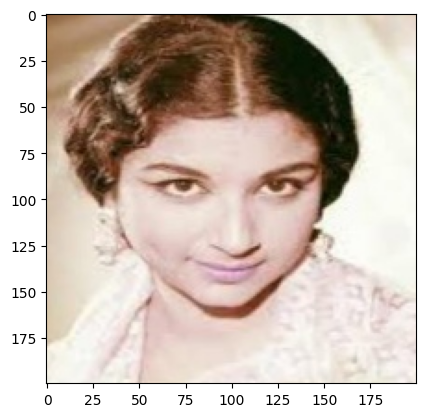

|ACTUAL| The person in the image is actualy a female and her actual age is 30 years.
|PREDICTED| The person in the image is a female and her age is approximately 26 years.
499/499 [==============================] - 203s 406ms/step - loss: 7.9102 - gender_loss: 0.2786 - age_loss: 7.6317 - gender_accuracy: 0.8832 - age_mae: 7.6317 - val_loss: 8.2192 - val_gender_loss: 0.2900 - val_age_loss: 7.9292 - val_gender_accuracy: 0.8714 - val_age_mae: 7.9292
Epoch 17/50
1/1 [==============================] - 0s 26ms/step
35_0_3_20170119181105779.jpg


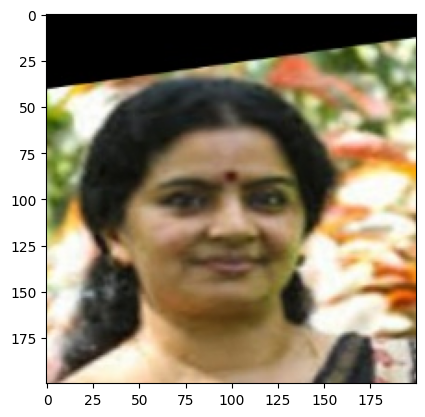

|ACTUAL| The person in the image is actualy a male and his actual age is 35 years.
|PREDICTED| The person in the image is a female and her age is approximately 28 years.
499/499 [==============================] - 205s 411ms/step - loss: 7.9337 - gender_loss: 0.2791 - age_loss: 7.6546 - gender_accuracy: 0.8822 - age_mae: 7.6546 - val_loss: 8.3433 - val_gender_loss: 0.2871 - val_age_loss: 8.0562 - val_gender_accuracy: 0.8705 - val_age_mae: 8.0562
Epoch 18/50
1/1 [==============================] - 0s 26ms/step
32_0_1_20170113175300325.jpg


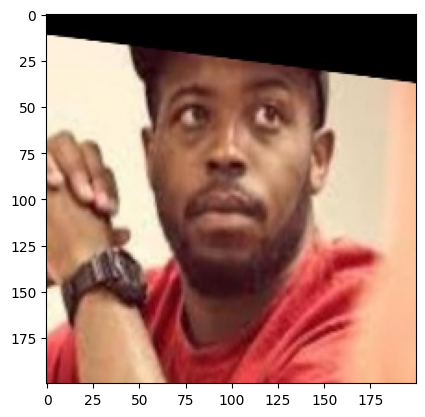

|ACTUAL| The person in the image is actualy a male and his actual age is 32 years.
|PREDICTED| The person in the image is a male and his age is approximately 36 years.
499/499 [==============================] - 213s 428ms/step - loss: 7.8389 - gender_loss: 0.2745 - age_loss: 7.5644 - gender_accuracy: 0.8855 - age_mae: 7.5644 - val_loss: 8.2815 - val_gender_loss: 0.2971 - val_age_loss: 7.9844 - val_gender_accuracy: 0.8688 - val_age_mae: 7.9844
Epoch 19/50
1/1 [==============================] - 0s 26ms/step
4_0_2_20170110213515094.jpg


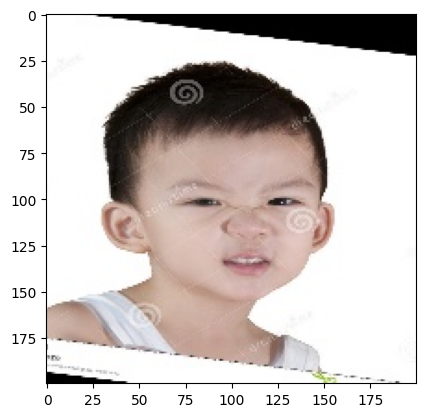

|ACTUAL| The person in the image is actualy a male and his actual age is 4 years.
|PREDICTED| The person in the image is a male and his age is approximately 1 years.
499/499 [==============================] - 206s 413ms/step - loss: 7.8494 - gender_loss: 0.2715 - age_loss: 7.5779 - gender_accuracy: 0.8861 - age_mae: 7.5779 - val_loss: 8.2434 - val_gender_loss: 0.2953 - val_age_loss: 7.9481 - val_gender_accuracy: 0.8708 - val_age_mae: 7.9481
Epoch 20/50
1/1 [==============================] - 0s 26ms/step
68_0_0_20170117174131505.jpg


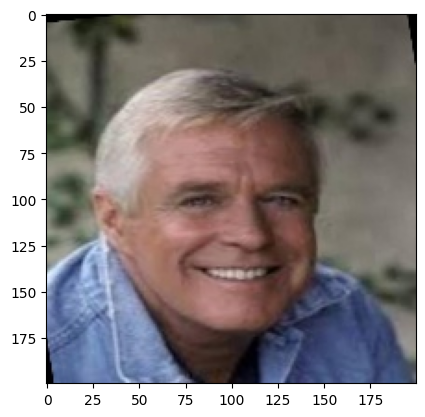

|ACTUAL| The person in the image is actualy a male and his actual age is 68 years.
|PREDICTED| The person in the image is a male and his age is approximately 62 years.
499/499 [==============================] - 207s 415ms/step - loss: 7.8155 - gender_loss: 0.2673 - age_loss: 7.5482 - gender_accuracy: 0.8875 - age_mae: 7.5482 - val_loss: 8.1598 - val_gender_loss: 0.2820 - val_age_loss: 7.8779 - val_gender_accuracy: 0.8830 - val_age_mae: 7.8779
Epoch 21/50
1/1 [==============================] - 0s 26ms/step
84_1_0_20170110175644800.jpg


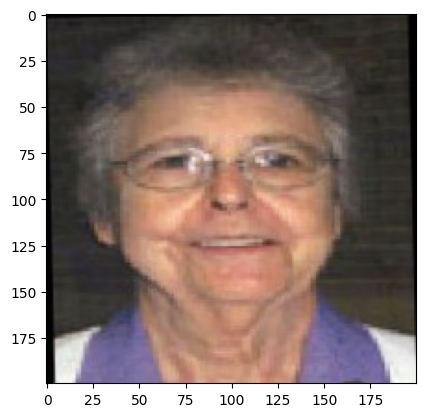

|ACTUAL| The person in the image is actualy a female and her actual age is 84 years.
|PREDICTED| The person in the image is a male and his age is approximately 62 years.
499/499 [==============================] - 204s 408ms/step - loss: 7.7788 - gender_loss: 0.2700 - age_loss: 7.5089 - gender_accuracy: 0.8879 - age_mae: 7.5089 - val_loss: 8.2109 - val_gender_loss: 0.2871 - val_age_loss: 7.9238 - val_gender_accuracy: 0.8746 - val_age_mae: 7.9238
Epoch 22/50
1/1 [==============================] - 0s 25ms/step
39_0_3_20170119203940533.jpg


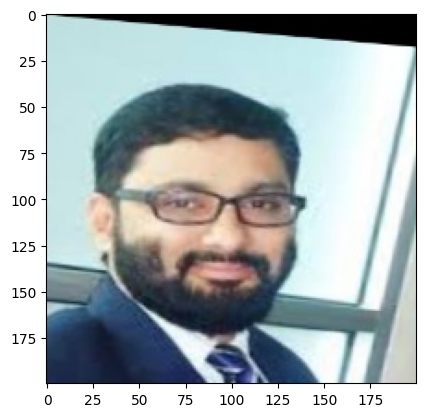

|ACTUAL| The person in the image is actualy a male and his actual age is 39 years.
|PREDICTED| The person in the image is a male and his age is approximately 44 years.
499/499 [==============================] - 207s 415ms/step - loss: 7.7886 - gender_loss: 0.2724 - age_loss: 7.5162 - gender_accuracy: 0.8852 - age_mae: 7.5162 - val_loss: 8.1136 - val_gender_loss: 0.2867 - val_age_loss: 7.8270 - val_gender_accuracy: 0.8749 - val_age_mae: 7.8270
Epoch 23/50
1/1 [==============================] - 0s 40ms/step
50_1_1_20170113001907523.jpg


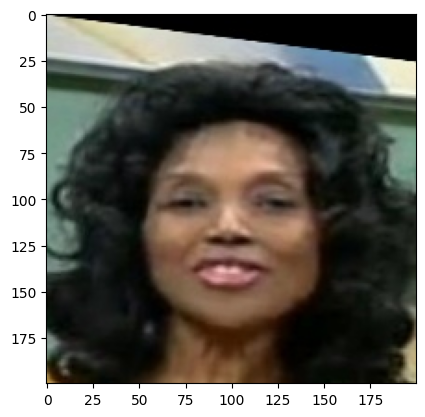

|ACTUAL| The person in the image is actualy a female and her actual age is 50 years.
|PREDICTED| The person in the image is a female and her age is approximately 32 years.
499/499 [==============================] - 207s 415ms/step - loss: 7.7560 - gender_loss: 0.2715 - age_loss: 7.4845 - gender_accuracy: 0.8847 - age_mae: 7.4845 - val_loss: 8.1987 - val_gender_loss: 0.2980 - val_age_loss: 7.9007 - val_gender_accuracy: 0.8711 - val_age_mae: 7.9007
Epoch 24/50
1/1 [==============================] - 0s 27ms/step
45_0_0_20170117181001561.jpg


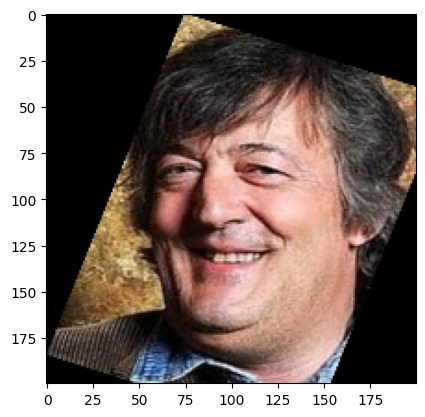

|ACTUAL| The person in the image is actualy a male and his actual age is 45 years.
|PREDICTED| The person in the image is a female and her age is approximately 51 years.
499/499 [==============================] - 211s 423ms/step - loss: 7.7415 - gender_loss: 0.2648 - age_loss: 7.4767 - gender_accuracy: 0.8875 - age_mae: 7.4767 - val_loss: 8.1709 - val_gender_loss: 0.2871 - val_age_loss: 7.8838 - val_gender_accuracy: 0.8778 - val_age_mae: 7.8838
Epoch 25/50
1/1 [==============================] - 0s 26ms/step
32_1_1_20170112220414584.jpg


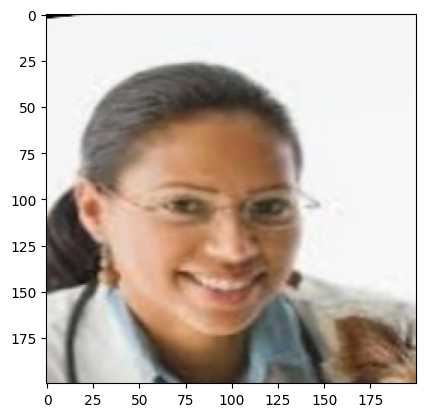

|ACTUAL| The person in the image is actualy a female and her actual age is 32 years.
|PREDICTED| The person in the image is a male and his age is approximately 42 years.
499/499 [==============================] - 210s 422ms/step - loss: 7.7116 - gender_loss: 0.2646 - age_loss: 7.4470 - gender_accuracy: 0.8877 - age_mae: 7.4470 - val_loss: 8.0238 - val_gender_loss: 0.2967 - val_age_loss: 7.7271 - val_gender_accuracy: 0.8737 - val_age_mae: 7.7271
Epoch 26/50
1/1 [==============================] - 0s 33ms/step
50_1_3_20170117151044708.jpg


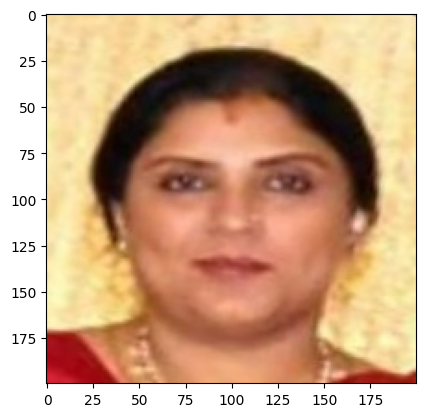

|ACTUAL| The person in the image is actualy a female and her actual age is 50 years.
|PREDICTED| The person in the image is a male and his age is approximately 27 years.
499/499 [==============================] - 213s 426ms/step - loss: 7.6782 - gender_loss: 0.2626 - age_loss: 7.4156 - gender_accuracy: 0.8921 - age_mae: 7.4156 - val_loss: 8.0351 - val_gender_loss: 0.2833 - val_age_loss: 7.7518 - val_gender_accuracy: 0.8757 - val_age_mae: 7.7518
Epoch 27/50
1/1 [==============================] - 0s 27ms/step
16_1_0_20170109204409777.jpg


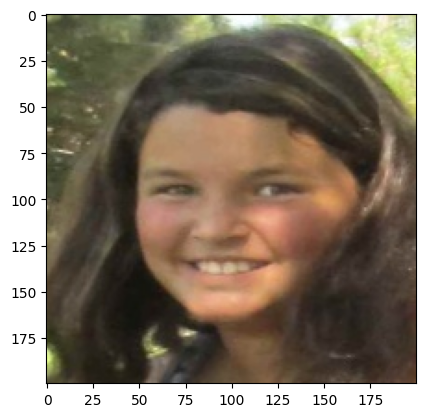

|ACTUAL| The person in the image is actualy a female and her actual age is 16 years.
|PREDICTED| The person in the image is a female and her age is approximately 24 years.
499/499 [==============================] - 211s 422ms/step - loss: 7.6785 - gender_loss: 0.2617 - age_loss: 7.4168 - gender_accuracy: 0.8888 - age_mae: 7.4168 - val_loss: 8.1259 - val_gender_loss: 0.2966 - val_age_loss: 7.8293 - val_gender_accuracy: 0.8676 - val_age_mae: 7.8293
Epoch 28/50
1/1 [==============================] - 0s 26ms/step
26_0_3_20170104230509745.jpg


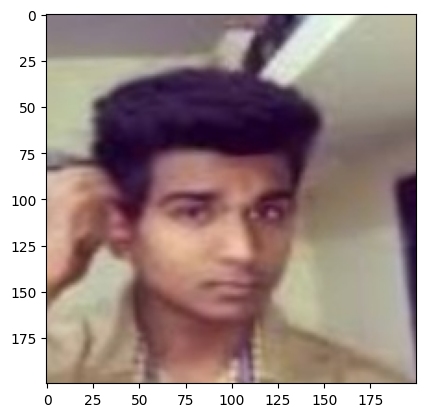

|ACTUAL| The person in the image is actualy a male and his actual age is 26 years.
|PREDICTED| The person in the image is a male and his age is approximately 28 years.
499/499 [==============================] - 213s 427ms/step - loss: 7.6746 - gender_loss: 0.2610 - age_loss: 7.4136 - gender_accuracy: 0.8899 - age_mae: 7.4136 - val_loss: 8.1398 - val_gender_loss: 0.2934 - val_age_loss: 7.8465 - val_gender_accuracy: 0.8763 - val_age_mae: 7.8465
Epoch 29/50
1/1 [==============================] - 0s 27ms/step
3_1_2_20161220220305826.jpg


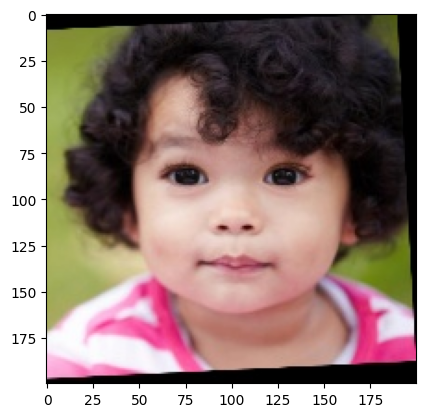

|ACTUAL| The person in the image is actualy a female and her actual age is 3 years.
|PREDICTED| The person in the image is a female and her age is approximately 2 years.
499/499 [==============================] - 212s 424ms/step - loss: 7.6602 - gender_loss: 0.2616 - age_loss: 7.3987 - gender_accuracy: 0.8914 - age_mae: 7.3987 - val_loss: 8.0929 - val_gender_loss: 0.2926 - val_age_loss: 7.8002 - val_gender_accuracy: 0.8722 - val_age_mae: 7.8002
Epoch 30/50
1/1 [==============================] - 0s 26ms/step
35_1_0_20170117092205487.jpg


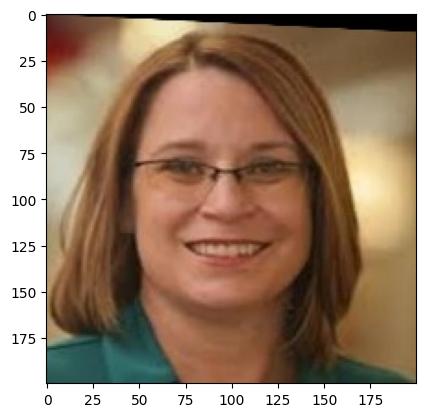

|ACTUAL| The person in the image is actualy a female and her actual age is 35 years.
|PREDICTED| The person in the image is a female and her age is approximately 39 years.
499/499 [==============================] - 248s 497ms/step - loss: 7.6766 - gender_loss: 0.2603 - age_loss: 7.4163 - gender_accuracy: 0.8906 - age_mae: 7.4163 - val_loss: 8.0103 - val_gender_loss: 0.2841 - val_age_loss: 7.7262 - val_gender_accuracy: 0.8696 - val_age_mae: 7.7262
Epoch 31/50
1/1 [==============================] - 0s 29ms/step
3_1_0_20170109192304730.jpg


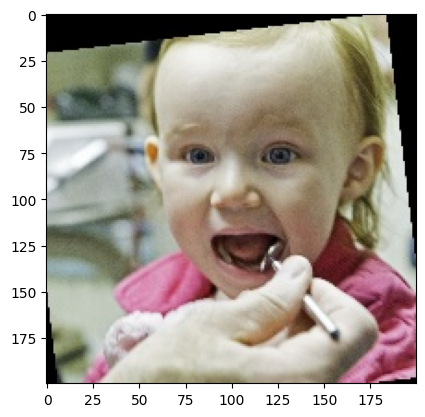

|ACTUAL| The person in the image is actualy a female and her actual age is 3 years.
|PREDICTED| The person in the image is a male and his age is approximately 8 years.
499/499 [==============================] - 213s 427ms/step - loss: 7.6548 - gender_loss: 0.2576 - age_loss: 7.3972 - gender_accuracy: 0.8927 - age_mae: 7.3972 - val_loss: 8.1163 - val_gender_loss: 0.2868 - val_age_loss: 7.8295 - val_gender_accuracy: 0.8734 - val_age_mae: 7.8295
Epoch 32/50
1/1 [==============================] - 0s 28ms/step
80_0_0_20170117175522915.jpg


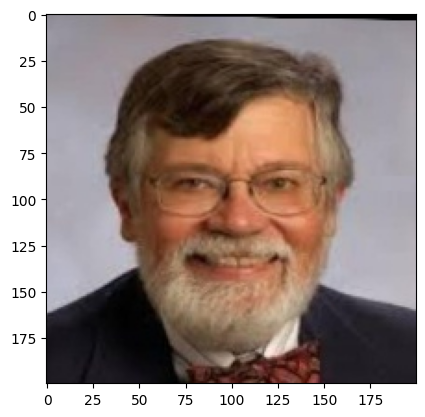

|ACTUAL| The person in the image is actualy a male and his actual age is 80 years.
|PREDICTED| The person in the image is a male and his age is approximately 64 years.
499/499 [==============================] - 213s 428ms/step - loss: 7.6041 - gender_loss: 0.2591 - age_loss: 7.3450 - gender_accuracy: 0.8899 - age_mae: 7.3450 - val_loss: 7.8541 - val_gender_loss: 0.2892 - val_age_loss: 7.5649 - val_gender_accuracy: 0.8754 - val_age_mae: 7.5649
Epoch 33/50
1/1 [==============================] - 0s 27ms/step
65_1_2_20161219160537365.jpg


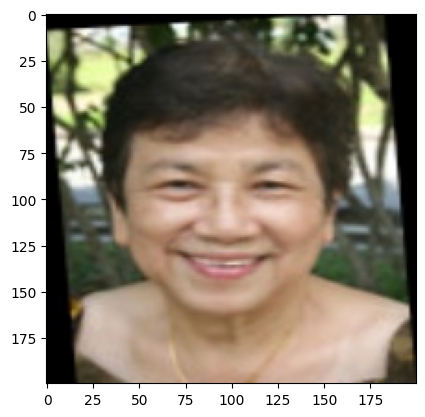

|ACTUAL| The person in the image is actualy a female and her actual age is 65 years.
|PREDICTED| The person in the image is a male and his age is approximately 26 years.
499/499 [==============================] - 214s 429ms/step - loss: 7.5873 - gender_loss: 0.2562 - age_loss: 7.3311 - gender_accuracy: 0.8948 - age_mae: 7.3311 - val_loss: 8.1326 - val_gender_loss: 0.2904 - val_age_loss: 7.8422 - val_gender_accuracy: 0.8708 - val_age_mae: 7.8422
Epoch 34/50
1/1 [==============================] - 0s 26ms/step
38_0_0_20170117135518125.jpg


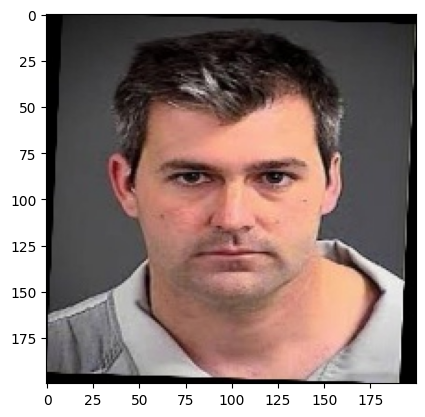

|ACTUAL| The person in the image is actualy a male and his actual age is 38 years.
|PREDICTED| The person in the image is a male and his age is approximately 37 years.
499/499 [==============================] - 213s 428ms/step - loss: 7.6254 - gender_loss: 0.2516 - age_loss: 7.3738 - gender_accuracy: 0.8953 - age_mae: 7.3738 - val_loss: 8.0423 - val_gender_loss: 0.2950 - val_age_loss: 7.7473 - val_gender_accuracy: 0.8760 - val_age_mae: 7.7473
Epoch 35/50
1/1 [==============================] - 0s 28ms/step
26_1_0_20170117173557316.jpg


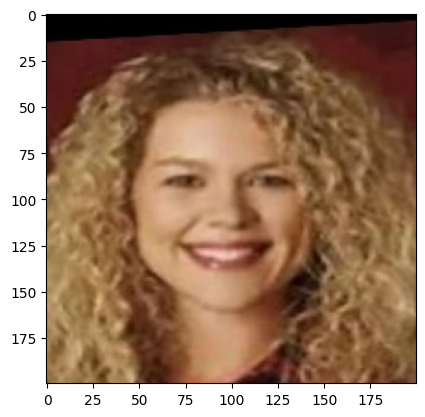

|ACTUAL| The person in the image is actualy a female and her actual age is 26 years.
|PREDICTED| The person in the image is a female and her age is approximately 39 years.
499/499 [==============================] - 218s 437ms/step - loss: 7.5334 - gender_loss: 0.2544 - age_loss: 7.2789 - gender_accuracy: 0.8941 - age_mae: 7.2789 - val_loss: 8.0058 - val_gender_loss: 0.2709 - val_age_loss: 7.7349 - val_gender_accuracy: 0.8844 - val_age_mae: 7.7349
Epoch 36/50
1/1 [==============================] - 0s 29ms/step
23_1_0_20170116221815459.jpg


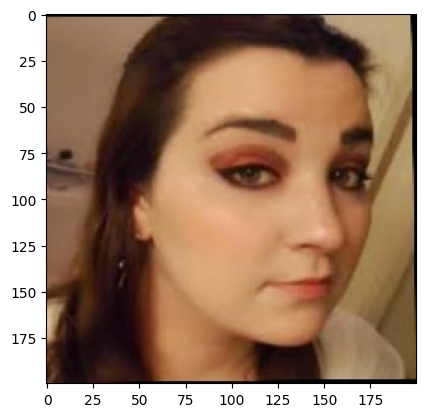

|ACTUAL| The person in the image is actualy a female and her actual age is 23 years.
|PREDICTED| The person in the image is a female and her age is approximately 23 years.
499/499 [==============================] - 220s 441ms/step - loss: 7.6092 - gender_loss: 0.2527 - age_loss: 7.3565 - gender_accuracy: 0.8920 - age_mae: 7.3565 - val_loss: 8.0268 - val_gender_loss: 0.2725 - val_age_loss: 7.7543 - val_gender_accuracy: 0.8804 - val_age_mae: 7.7543
Epoch 37/50
1/1 [==============================] - 0s 27ms/step
32_0_1_20170114031959964.jpg


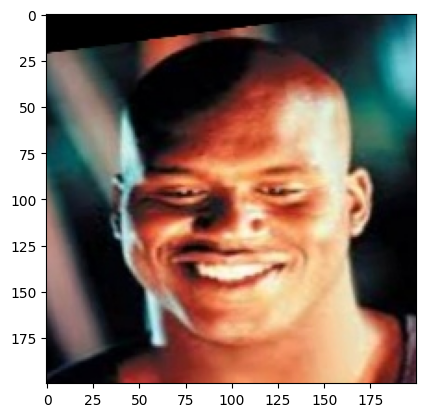

|ACTUAL| The person in the image is actualy a male and his actual age is 32 years.
|PREDICTED| The person in the image is a male and his age is approximately 29 years.
Restoring model weights from the end of the best epoch: 32.
499/499 [==============================] - 221s 443ms/step - loss: 7.5892 - gender_loss: 0.2499 - age_loss: 7.3393 - gender_accuracy: 0.8961 - age_mae: 7.3393 - val_loss: 7.9540 - val_gender_loss: 0.2934 - val_age_loss: 7.6606 - val_gender_accuracy: 0.8751 - val_age_mae: 7.6606
Epoch 37: early stopping


In [61]:
history = model.fit(x=train_gen, epochs=50, validation_data=val_gen, batch_size=64,callbacks=[CustomCallBacks(),callback])

**VGG conclusions**
- SGD : val_loss: 8.4599 , val_gender_accuracy: 0.8691
- Adadelta : val_loss: 11.2950,val_gender_accuracy: 0.8355 for 50 epochs
- Adagrad : val_loss: 8.9342, val_gender_accuracy: 0.8586 for 42 epochs
- Adamax : val_loss: 8.1762 ,val_gender_accuracy: 0.8420 for 21 epochs
- RMSProp : val_loss: 9.4718, val_gender_accuracy: 0.8255 for 5 epochs
- ADAM : val_loss: 8.5645 , acc =  0.8561 for 15 epochs

**INCEPTION v3 conclusions**
- Adamax : val_loss: 14.3411 ,val_gender_accuracy: 0.8631 for 5 epochs
- RMSprop: val_loss: 8.4631 - val_gender_accuracy: 0.8958 for 35epochs
- Adam: val_loss: 7.6910 - val_gender_accuracy: 0.8510 for 15 epochs
- SGD : val_loss: 14.7010 - val_gender_accuracy: 0.8854 for 15 epochs
- Adagrad: val_loss: 7.4039 - val_gender_accuracy: 0.8987 for 35 epochs

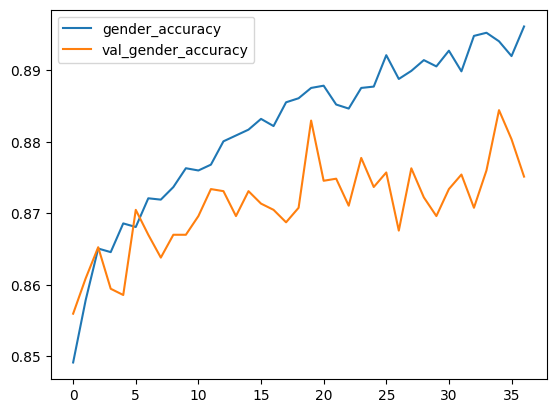

In [62]:
plt.plot(history.history['gender_accuracy'])
plt.plot(history.history['val_gender_accuracy'])
plt.legend(labels=['gender_accuracy','val_gender_accuracy'])

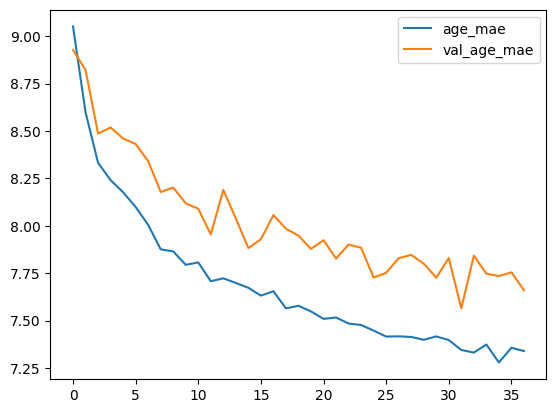

In [63]:
plt.plot(history.history['age_mae'])
plt.plot(history.history['val_age_mae'])
plt.legend(labels=['age_mae','val_age_mae'])


In [64]:
#saving the model:
history.model.save('/content/drive/MyDrive/models/Gender-Age')

In [65]:
#loading the saved model:
model = keras.models.load_model('/content/drive/MyDrive/models/Gender-Age')

## Testing the model using a test set:

In [66]:
# function for prediction:
def age_gender_predictor(img_path):
    og_age = img_path.split('_')[0] #extracting original age
    og_gen = img_path.split('_')[1] #extracting original gender

    img = cv2.imread('test/'+img_path) #reading the image
    plt_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) #converting BGR to RGB
    image = np.expand_dims(img, axis=0) #expanding the shape to (1,200,200,3)
    image = image/255.0 #normalizaing the values in the array.
    
    pred = model.predict(image) #predicting the image output
    pred_gen = pred[0][0][0] #assigning predicted gender
    pred_age = int(pred[1][0][0]) #assigning predicted age

    #printing the image
    print(img_path)
    plt.imshow(plt_img)
    plt.show()
    
    #printing original age and gender
    if og_gen == '0':
        print("|ACTUAL| The person in the image is actualy a male and his actual age is {} years.".format(og_age))
    else:
        print("|ACTUAL| The person in the image is actualy a female and her actual age is {} years.".format(og_age))

    #printing predicted age and gender
    if pred_gen <= 0.5:
      print("|PREDICTED| The person in the image is a male and his age is approximately {} years.".format(pred_age))      
    else:
      print("|PREDICTED| The person in the image is a female and her age is approximately {} years.".format(pred_age))


### Test 1

1/1 [==============================] - 0s 29ms/step
22_1_1_20170112230505525.jpg


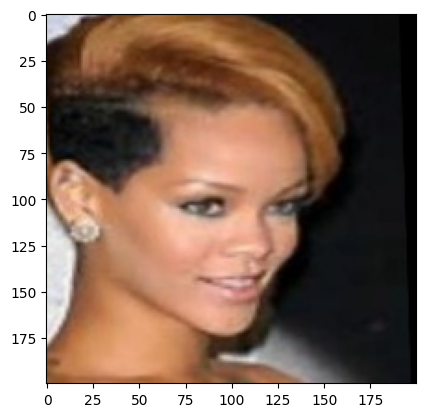

|ACTUAL| The person in the image is actualy a female and her actual age is 22 years.
|PREDICTED| The person in the image is a female and her age is approximately 24 years.


In [71]:
#testing the model:
num = random.randint(0,len(os.listdir('test'))) #generating a random number
img_path = os.listdir('test')[num] #fetching the file name
age_gender_predictor(img_path)

### Test 2

1/1 [==============================] - 0s 29ms/step
80_1_0_20170120221022764.jpg


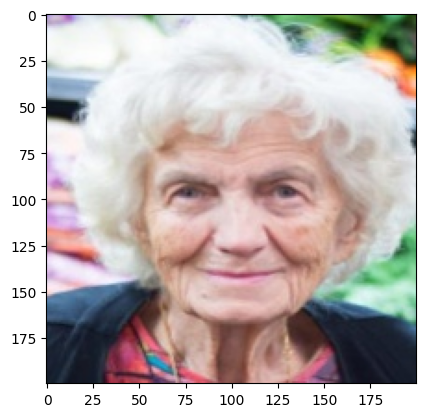

|ACTUAL| The person in the image is actualy a female and her actual age is 80 years.
|PREDICTED| The person in the image is a female and her age is approximately 81 years.


In [75]:
#testing the model:
num = random.randint(0,len(os.listdir('test'))) #generating a random number
img_path = os.listdir('test')[num] #fetching the file name
age_gender_predictor(img_path)

### Test 3

1/1 [==============================] - 0s 47ms/step
73_0_1_20170117195312638.jpg


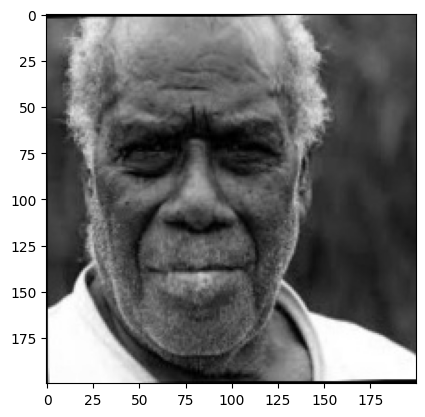

|ACTUAL| The person in the image is actualy a male and his actual age is 73 years.
|PREDICTED| The person in the image is a male and his age is approximately 74 years.


In [110]:
#testing the model:
num = random.randint(0,len(os.listdir('test'))) #generating a random number
img_path = os.listdir('test')[num] #fetching the file name
age_gender_predictor(img_path)

### Test 4

1/1 [==============================] - 0s 28ms/step
32_1_1_20170113012946729.jpg


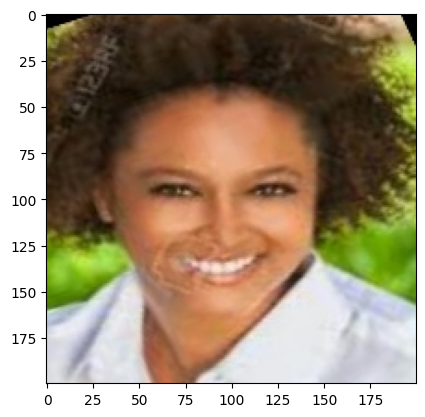

|ACTUAL| The person in the image is actualy a female and her actual age is 32 years.
|PREDICTED| The person in the image is a female and her age is approximately 33 years.


In [78]:
#testing the model:
num = random.randint(0,len(os.listdir('test'))) #generating a random number
img_path = os.listdir('test')[num] #fetching the file name
age_gender_predictor(img_path)

### Test 5

1/1 [==============================] - 0s 32ms/step
23_1_4_20170103233611875.jpg


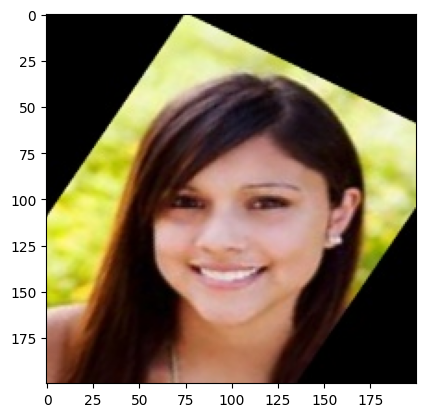

|ACTUAL| The person in the image is actualy a female and her actual age is 23 years.
|PREDICTED| The person in the image is a female and her age is approximately 24 years.


In [81]:
#testing the model:
num = random.randint(0,len(os.listdir('test'))) #generating a random number
img_path = os.listdir('test')[num] #fetching the file name
age_gender_predictor(img_path)

### Test 6

1/1 [==============================] - 0s 29ms/step
25_1_1_20170112230805931.jpg


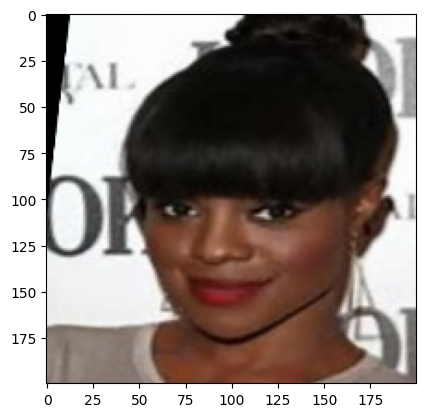

|ACTUAL| The person in the image is actualy a female and her actual age is 25 years.
|PREDICTED| The person in the image is a female and her age is approximately 25 years.


In [84]:
#testing the model:
num = random.randint(0,len(os.listdir('test'))) #generating a random number
img_path = os.listdir('test')[num] #fetching the file name
age_gender_predictor(img_path)

### Test 7

1/1 [==============================] - 0s 31ms/step
2_0_2_20161219205542789.jpg


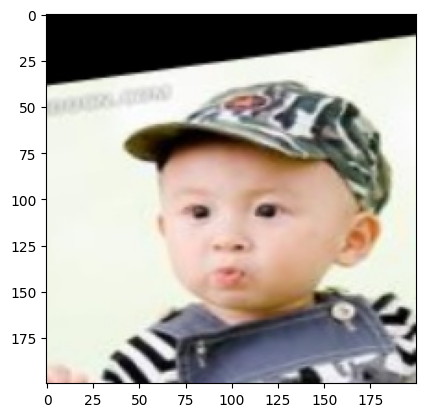

|ACTUAL| The person in the image is actualy a male and his actual age is 2 years.
|PREDICTED| The person in the image is a male and his age is approximately 1 years.


In [109]:
#testing the model:
num = random.randint(0,len(os.listdir('test'))) #generating a random number
img_path = os.listdir('test')[num] #fetching the file name
age_gender_predictor(img_path)

### Test 8

1/1 [==============================] - 0s 97ms/step
26_0_2_20170104023216134.jpg


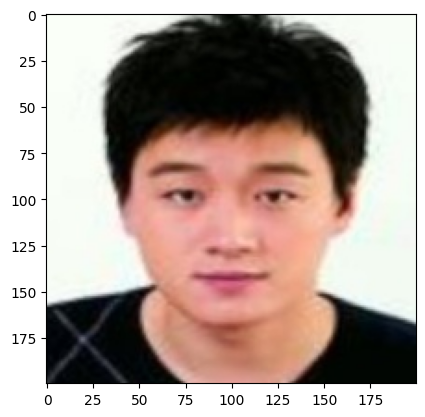

|ACTUAL| The person in the image is actualy a male and his actual age is 26 years.
|PREDICTED| The person in the image is a male and his age is approximately 24 years.


In [88]:
#testing the model:
num = random.randint(0,len(os.listdir('test'))) #generating a random number
img_path = os.listdir('test')[num] #fetching the file name
age_gender_predictor(img_path)

### Test 9

1/1 [==============================] - 0s 28ms/step
36_0_2_20170104200528385.jpg


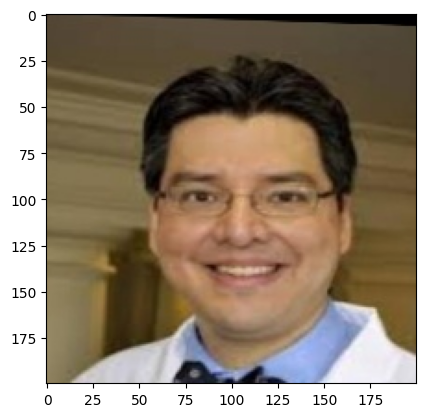

|ACTUAL| The person in the image is actualy a male and his actual age is 36 years.
|PREDICTED| The person in the image is a male and his age is approximately 38 years.


In [94]:
#testing the model:
num = random.randint(0,len(os.listdir('test'))) #generating a random number
img_path = os.listdir('test')[num] #fetching the file name
age_gender_predictor(img_path)

### Test 10

1/1 [==============================] - 0s 49ms/step
40_1_0_20170116224841122.jpg


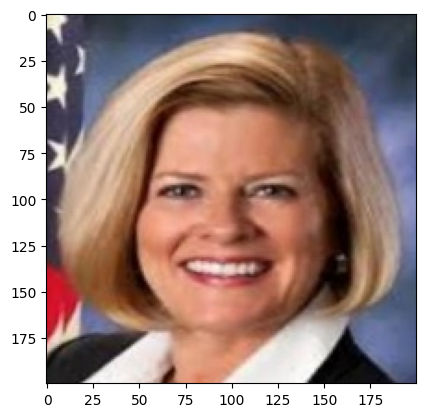

|ACTUAL| The person in the image is actualy a female and her actual age is 40 years.
|PREDICTED| The person in the image is a female and her age is approximately 38 years.


In [95]:
#testing the model:
num = random.randint(0,len(os.listdir('test'))) #generating a random number
img_path = os.listdir('test')[num] #fetching the file name
age_gender_predictor(img_path)